<!-- Autogenerated by `scripts/make_examples.py` -->
<table align="left">
    <td>
        <a target="_blank" href="https://colab.research.google.com/github/voxel51/fiftyone-examples/blob/master/examples/training_clearml_detector.ipynb">
            <img src="https://user-images.githubusercontent.com/25985824/104791629-6e618700-5769-11eb-857f-d176b37d2496.png" height="32" width="32">
            Try in Google Colab
        </a>
    </td>
    <td>
        <a target="_blank" href="https://nbviewer.jupyter.org/github/voxel51/fiftyone-examples/blob/master/examples/training_clearml_detector.ipynb">
            <img src="https://user-images.githubusercontent.com/25985824/104791634-6efa1d80-5769-11eb-8a4c-71d6cb53ccf0.png" height="32" width="32">
            Share via nbviewer
        </a>
    </td>
    <td>
        <a target="_blank" href="https://github.com/voxel51/fiftyone-examples/blob/master/examples/training_clearml_detector.ipynb">
            <img src="https://user-images.githubusercontent.com/25985824/104791633-6efa1d80-5769-11eb-8ee3-4b2123fe4b66.png" height="32" width="32">
            View on GitHub
        </a>
    </td>
    <td>
        <a href="https://github.com/voxel51/fiftyone-examples/raw/master/examples/training_clearml_detector.ipynb" download>
            <img src="https://user-images.githubusercontent.com/25985824/104792428-60f9cc00-576c-11eb-95a4-5709d803023a.png" height="32" width="32">
            Download notebook
        </a>
    </td>
</table>


# How to Train Your Dragon (Detector)

Often thought to be the stuff of legends, we aim to shed light on a mythical entity. Dragons? No... An effective and repeatable data-centric machine learning workflow, of course! It seems that many machine learning researchers and engineers these days are focused on developing the optimal model architecture for their tasks. In reality, the most surefire way to achieve a high-performing model is to meticulously understand, track, and improve your datasets and experimental results.

In this notebook, we will walk through the process of developing a computer vision model and dataset in a repeatable and effective way utilizing [ClearML](https://clear.ml/) and [FiftyOne](https://fiftyone.ai). Specifically, we will be training the object detection model DETR on a dataset of dragon images, though the general workflow presented is extensible to nearly any computer vision and machine learning task.

[FiftyOne](https://fiftyone.ai) is an open-source tool for building high-quality datasets and computer vision models with a [powerful API](https://voxel51.com/docs/fiftyone/user_guide/using_views.html) and [intuitive App](https://voxel51.com/docs/fiftyone/user_guide/app.html) letting you quickly understand the quality of your dataset, find your model's failure modes, and improve your datasets and models. On the other hand, [ClearML](https://clear.ml/) is an open-source platform that automates and simplifies developing and managing machine learning solutions through an end-to-end MLOps suite allowing you to focus on developing your ML code and automation, while ClearML ensures your work is reproducible and scalable.

ClearML and FiftyOne go hand-in-hand with one another in your machine learning workflows. The combination of flexible, hands-on visualization and analysis of data and model results of FiftyOne combined with the experimental result tracking of ClearML produces a system that lets you quickly explore and improve your datasets while also persisting all of the changes and progress made to achieving a high-performing model.

## Setup

To start, we will need to [install FiftyOne](https://voxel51.com/docs/fiftyone/getting_started/install.html) and [ClearML](https://clear.ml/):

In [ ]:
!pip install fiftyone 

If you run into a cv2 error when importing FiftyOne later on, it is an issue with OpenCV in Colab environments. [Follow these instructions to resolve it.](https://github.com/voxel51/fiftyone/issues/1494#issuecomment-1003148448)

In order to start tracking your experiments you'll need a free clearML account to send data to the community server or you can always host your own server too!

In [ ]:
# Preferably run this in a terminal if you can, but if in a (colab) notebook
# the input is not recognised properly. Press enter once, to give clearml-init
# an empty input and then fill in the fields one at a time.
!pip install clearml
!clearml-init

Download the DETR repository that has been updated with the clearML experiment tracking code.

In [31]:
%cd /content

/content2


In [ ]:
# This is for when running in colab
!git clone https://github.com/thepycoder/detr.git

Also import torch and check if a GPU is available

In [8]:
import torch
import fiftyone
from datetime import datetime
print(torch.__version__, torch.cuda.is_available())

1.10.0 True


The rest of the clearml-specific code is added in the `main.py` file and will keep track of every time it is ran from here. Keeping track of all the variables, arguments, metrics, model files and so on.

## [The Tale of the Data and the Model FAIR](https://awoiaf.westeros.org/index.php/The_Bear_and_the_Maiden_Fair)

To keep things interesting, we created a whole new dataset especially for the occasion: dragons! We gathered 115 images of dragons and annotated them. Interestingly they are both cartoon-style dragons and more 'realistic' dragons.

To start things out, let's download the dataset. [This repository](https://github.com/thepycoder/dragon_data) will download the images for you. Later on we will use this dataset directly to train a model and visualize the results.

In [31]:
%cd /content

/content2


In [ ]:
!git clone https://github.com/thepycoder/dragon_data

Let's download the data to our disk by using the `get_dataset.py` script from the repo.

In [7]:
%cd dragon_data
!python get_dataset.py

/content2/dragon_data
100%|███████████████████████████████████████████| 10/10 [00:01<00:00,  6.39it/s]


In the next section, we look at [Meta (Facebook) research's DETR](https://github.com/facebookresearch/detr), an object detection network based on the popular transformers architecture that we used and updated with ClearML experiment tracking capabilities.

## Integrating ClearML Experiment Tracking into Pytorch DETR

The main entrypoint in the original DETR code is the `main.py` script, which contains the main training loop. To start tracking our training runs in clearML we simply have to add 2 lines of code this script and we're off to the races!

You can check this change in `main.py` starting from line 19.
```python
# Imports ...

# Initialise a clearML task and its corresponding logger
from clearml import Task
task = Task.init(project_name='dragon_detector', task_name=f'DETR')

# Rest of code ...
```

These 2 lines will already log all hyperparameters used, console output, code changes and much more.

![parameters](images/training_clearml_detector/parameters.png)

![artifacts](images/training_clearml_detector/artifacts.png)

![console](images/training_clearml_detector/console.png)

### Manually adding scalars

When using popular frameworks like detectron2, tensorboard and others, scalars (e.g. loss, mAP etc.) will automatically be logged by clearML. But in case you have a model implementation where this does not happen automatically, it's still very easy to add parameters to log manually.

First, we add a clearML logger. Ideally, we place it under the 2 magic lines of code we just put in.

You can check this change in `main.py` starting from line 22.
```python
# Imports ...

# Initialise a clearML task and its corresponding logger
from clearml import Task
task = Task.init(project_name='dragon_detector', task_name=f'DETR')
logger = task.get_logger()

# Rest of code ...
```

Next, we can use this logger to add anything we want to the clearML report. In this case, DETR already keeps track of many important variables such as epoch number, all different losses for that epoch, training and testing accuracy etc. It keeps track of these metrics in a dict, so all we have to do is add this dict to our logger and BOOM! We're tracking them!

In this case we did some additional things: we only log these metrics every 10 epochs and filter out the `coco_eval_bbox` key from the dictionary as it is not a metric, but a bounding box which is difficult to plot...

```python

# Original DETR evaluation step
test_stats, coco_evaluator = evaluate(
    model, criterion, postprocessors, data_loader_val, base_ds, device, args.output_dir
)

# Original DETR dict containing metrics
log_stats = {**{f'train_{k}': v for k, v in train_stats.items()},
                **{f'test_{k}': v for k, v in test_stats.items()},
                'epoch': epoch,
                'n_parameters': n_parameters}

# Added ClearML tracking
if epoch % 10 == 0:
    for key, value in log_stats.items():
        if 'coco_eval_bbox' in key:
            continue
        logger.report_scalar(title=key, series=key, value=value, iteration=epoch)

```

In the clearML dashboard, you'll find these metrics under Results -> Scalars and they'll be plotted for you.

![clearml scalar view](images/training_clearml_detector/scalars.png)



### Manually adding debug samples

Finally, we would like to add Debug Samples. This is where you can log images and their detections straight to the clearML dashboard, so we can visually see that our training has worked!
Again, if using something like tensorboard, debug images will be captured automatically but DETR did not evaluate any images in it's training loop, so we'll have to add a little more code now to get them.


First, we're mainly interested in the detection quality at the end of training. So we add a custom function at the complete end of the training script, that will run evaluation with the currently trained model on all the validation images and log them to clearML.

In `main.py` we add a function call to run evaluation on validation images: line 263 (last line)
```python
# Main entrypoint of training script
if __name__ == '__main__':
    parser = argparse.ArgumentParser('DETR training and evaluation script', parents=[get_args_parser()])
    args = parser.parse_args()
    if args.output_dir:
        Path(args.output_dir).mkdir(parents=True, exist_ok=True)
    main(args)
    run_visual_validation(args, ['dragon'], logger)
```

The `run_visual_validation` function loads the model we just trained and sends a call to `run_visual_validation_workflow` for every validation image we have.
```python
def run_visual_validation(args, classes, logger):
    # Get the model ready
    model = torch.hub.load('facebookresearch/detr',
                           'detr_resnet50',
                           pretrained=False,
                           num_classes=args.num_classes)
    checkpoint = torch.load(Path(args.output_dir) / 'checkpoint.pth',
                            map_location='cpu')

    model.load_state_dict(checkpoint['model'],
                          strict=False)
    model.eval()

    # Iterate over the validation folder and run the model. For visual feedback.
    val_folder = Path(args.coco_path) / 'val'
    for img_name in os.listdir(val_folder):
        im = Image.open(Path(val_folder) / img_name)
        run_visual_validation_workflow(im, model, classes, logger, img_name)
```

The `run_visual_validation_workflow` on it's turn will take the validation image, normalize it, run it through the model, filter the predictions on a threshold and send the result out to be plotted.
```python
def run_visual_validation_workflow(my_image, my_model, classes, logger, img_name):
  # mean-std normalize the input image (batch-size: 1)
  img = transform(my_image).unsqueeze(0)

  # propagate through the model
  outputs = my_model(img)

  probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs,
                                                             img,
                                                             threshold=0.35)

  plot_image_results(my_image,
                     probas_to_keep,
                     bboxes_scaled,
                     classes,
                     logger,
                     img_name)
```

Finally, `plot_image_results` will make a matplotlib image from the validation image and the relevant predictions. Then with the single line `logger.report_matplotlib_figure` we send that matplotlib image to clearML. This is the only actual clearML line of code you need, the rest is needed to create the images.
```python
def plot_image_results(pil_img, prob, boxes, classes, logger, img_name):
    # colors for visualization
    colors = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
              [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]
    colors = colors * 100
    figure = plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{classes[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.savefig(img_name)
    logger.report_matplotlib_figure('Evaluation Results', img_name, figure,
                                    iteration=None, report_image=True,
                                    report_interactive=False)
```

This all leads to a very handy overview of the model performance in the clearML dashboard as can be seen below

![debug samples](images/training_clearml_detector/debug_samples.png)


## Train DETR

Since the data in our dragon dataset is limited, our model should be pretrained. 

This means getting a pretrained model and chopping off the class head, so we can retrain that part only.

In [32]:
%cd /content/detr

/content2/detr


In [ ]:
!pip install -r requirements.txt
!pip install pandas seaborn

In [33]:
# Get pretrained weights
checkpoint = torch.hub.load_state_dict_from_url(
    url='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth',
    map_location='cpu',
    check_hash=True)

# Remove class weights
del checkpoint["model"]["class_embed.weight"]
del checkpoint["model"]["class_embed.bias"]

# SaveOGH
torch.save(checkpoint, 'detr-r50_no-class-head.pth')

Our dataset is loadable in a COCO format which is expected by the main python script of DETR.

In [36]:
dataset_file = "dragons" # alternatively, implement your own coco-type dataset loader in datasets and add this "key" to datasets/__init__.py

dataDir = '/content/dragon_data/data' # should lead to a directory with a train and val folder as well as an annotations folder
num_classes = 2 # this int should be the amount of classes + 1

outDir = f'outputs_{datetime.now().strftime("%m:%d:%Y_%H:%M:%S")}'
resume = "detr-r50_no-class-head.pth"

Start training!

In [47]:
# We need at least 100 epochs for the dragons to be detected somewhat decently. It seems to be a difficult class.
!python main.py \
  --dataset_file $dataset_file \
  --coco_path $dataDir \
  --output_dir $outDir \
  --resume $resume \
  --num_classes $num_classes \
  --lr 1e-5 \
  --lr_backbone 1e-6 \
  --epochs 50

ClearML Task: created new task id=e551155d03d0424dafcfa14547b9585c
ClearML results page: https://app.community.clear.ml/projects/8131d2f23983461f8354156be95bc4f1/experiments/e551155d03d0424dafcfa14547b9585c/output/log
Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main
2021-12-16 11:04:49,754 - clearml.model - INFO - Selected model id: 3ce34161504342838a56bf457a7ec2e7
Running visual validation on outputs_12:16:2021_09:40:47
2021-12-16 11:04:53,419 - clearml.model - INFO - Selected model id: 127e4ace5efe45e598f26f86ffb636e5
/content2/detr/models/position_encoding.py:41: UserWarning:

__floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').

2021-12-16 11:05:30,662 - c

## ClearML Experiment Results

Quick and easy overview of the tracked training results, an interactive version of these graphs should be visible on your clearML dashboard!

In [20]:
from util.plot_utils import plot_logs
from pathlib import Path

log_directory = [Path(outDir)]

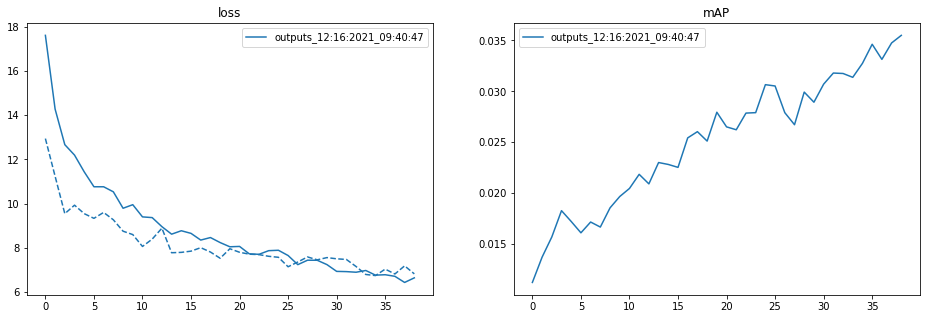

In [21]:
fields_of_interest = (
    'loss',
    'mAP',
    )

plot_logs(log_directory,
          fields_of_interest)

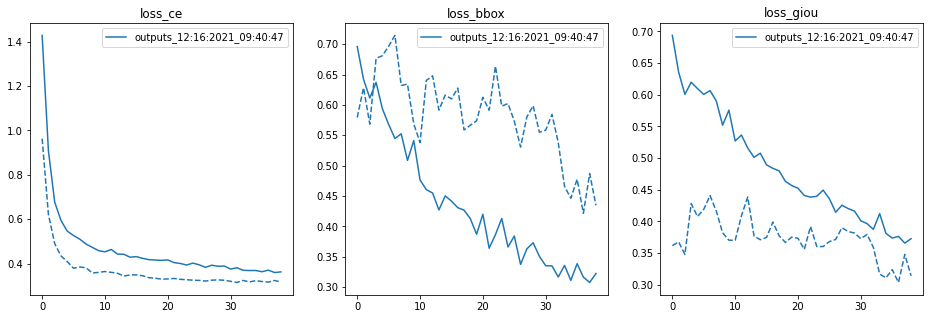

In [22]:
fields_of_interest = (
    'loss_ce',
    'loss_bbox',
    'loss_giou',
    )

plot_logs(log_directory,
          fields_of_interest)

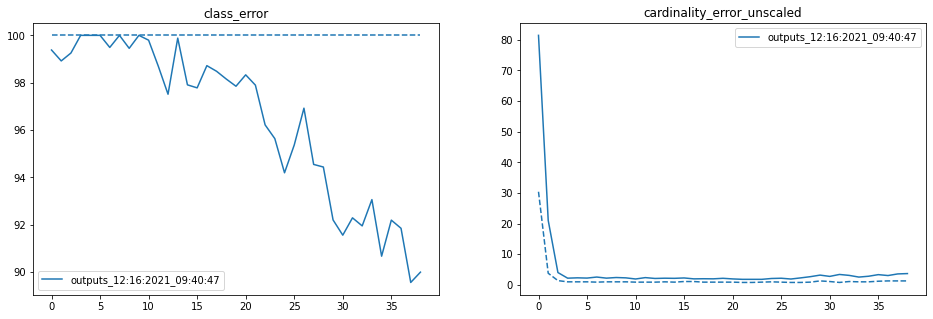

In [23]:
fields_of_interest = (
    'class_error',
    'cardinality_error_unscaled',
    )

plot_logs(log_directory,
          fields_of_interest)   

If we want to dig deeper and debug our model's performance meticulously, we can analyze it using FiftyOne!

## Digging in with FiftyOne

To start, let's [load the dataset into FiftyOne](https://voxel51.com/docs/fiftyone/user_guide/dataset_creation/index.html) so we can take a look at it in the [FiftyOne App](https://voxel51.com/docs/fiftyone/user_guide/app.html). Loading any custom dataset into FiftyOne is as simple as writing a Python loop. However, since this dataset is already in COCO format, we can load it with just one line of code. 

In [4]:
import fiftyone as fo
import os

In [12]:
%cd /content
# Should lead to a directory with a train and val folder as well as an annotations folder
dataset_dir = "dragon_data/data"
dataset_name = "dragons"

# Reload the dataset if it was persistent
if dataset_name in fo.list_datasets():
    fo.delete_dataset(dataset_name)

/content2


In [13]:
# Load the training dataset into FiftyOne and tag all samples with "train"
dataset = fo.Dataset.from_dir(
    dataset_type=fo.types.COCODetectionDataset,
    data_path= os.path.join(dataset_dir, "train"),
    labels_path= os.path.join(dataset_dir, "annotations/train.json"),
    name=dataset_name,
    tags="train",
)

# Add the validation data and tag the samples with "val"
dataset.add_dir(
    dataset_type=fo.types.COCODetectionDataset,
    data_path= os.path.join(dataset_dir, "val"),
    labels_path= os.path.join(dataset_dir, "annotations/val.json"),
    tags="val",
)

 100% |███████████████████| 98/98 [198.9ms elapsed, 0s remaining, 492.7 samples/s]     
 100% |███████████████████| 10/10 [15.1ms elapsed, 0s remaining, 662.2 samples/s]    


['61bb163f336bdf908449101a',
 '61bb163f336bdf908449101e',
 '61bb163f336bdf908449101f',
 '61bb163f336bdf9084491026',
 '61bb163f336bdf9084491027',
 '61bb163f336bdf9084491028',
 '61bb163f336bdf9084491029',
 '61bb163f336bdf9084491031',
 '61bb163f336bdf9084491032',
 '61bb163f336bdf9084491033']

The `launch_app()` method launches the App directly in the output of this cell and also returns a Session instance, which you can subsequently use to interact programmatically with the App.


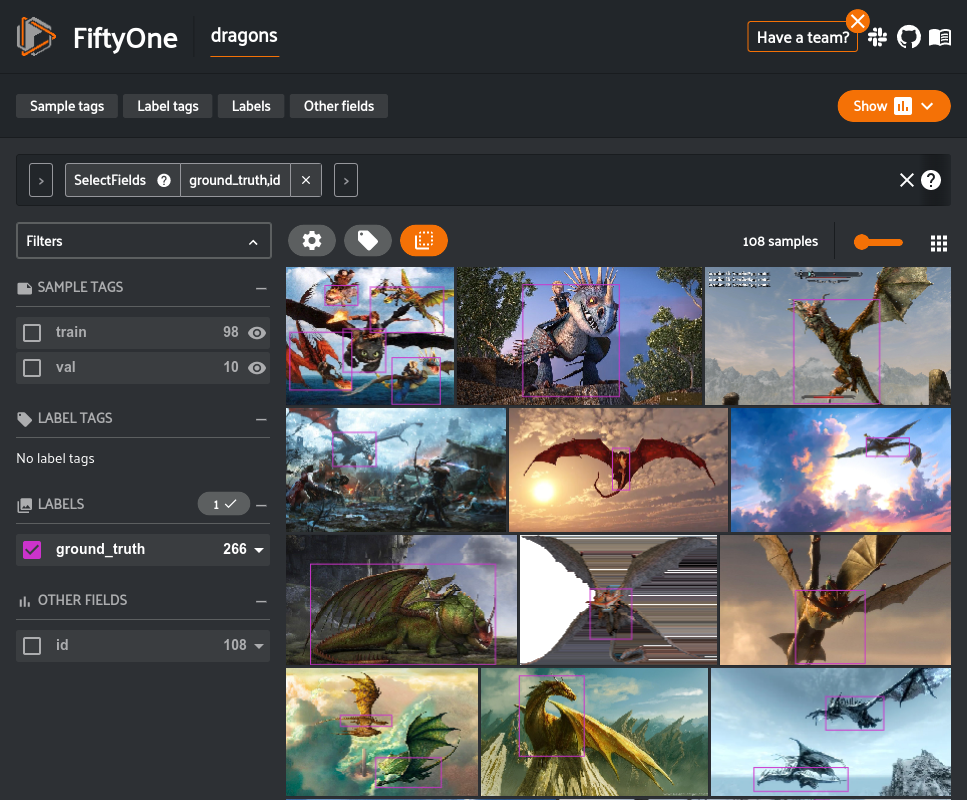

In [22]:
session = fo.launch_app(dataset)

In [ ]:
session.freeze() # Screenshot the App for this example

### Loading predictions into FiftyOne

Similar to how you load ground truth labels into a FiftyOne Dataset, [loading model predictions](https://voxel51.com/docs/fiftyone/user_guide/dataset_creation/index.html#model-predictions) is as easy as writing a Python loop. In general, loading predictions follows this pseudocode:

```python
import fiftyone as fo

dataset = fo.load_dataset("dragons")
img_paths = ["/path/to/img1.png", ...]

# Ex. custom prediction format: [bbox, label, confidence]
predictions = [[[0.1,0.2,0.3,0.5], "car", 0.921], ...]

for img_path, img_preds in zip(img_paths, predictions):
    sample = dataset[img_path]
    dets = []
    for bbox, label, conf in img_preds:
        dets.append(
            fo.Detection(
                bounding_box=bbox,
                label=label,
                confidence=confidence,
            )
        )
    sample["predictions"] = fo.Detections(detections=dets)
    sample.save()

# View predictions in the App
session = fo.launch_app(dataset)
```

Specifically, the following function iterates through a FiftyOne dataset, loads the image data, generates predictions, and stores those predictions on the dataset in FiftyOne format.

In [ ]:
from PIL import Image
import torchvision.transforms as T

def run_inference(samples, model, classes=["background", "dragon"]):
    # standard PyTorch mean-std input image normalization
    transform = T.Compose([
        T.Resize(800),
        T.ToTensor(),
        T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    # Iterate over `samples`, a FiftyOne dataset or view
    for sample in samples.iter_samples(progress=True):
        image = Image.open(sample.filepath)
        if image.mode != "RGB":
            image = image.convert("RGB")

        # Mean-std normalize the input image (batch-size: 1)
        image = transform(image).unsqueeze(0)

        # Perform inference
        preds = model(image)

        scores = preds["pred_logits"].softmax(-1)[0, :, :-1]

        keep_thresh = 0.2
        keep = scores.max(-1).values > keep_thresh

        scores = scores[keep].cpu().detach().numpy()
        boxes = preds["pred_boxes"][0, keep].cpu().detach().numpy()

        # Convert detections to FiftyOne format
        detections = [] 
        for score, box in zip(scores, boxes):
            # Output boxes in [center-x, center-y, width, height]
            # Convert to [top-left-x, top-left-y, width, height]
            cx, cy, w, h = box
            formatted_box = [cx - 0.5 * w, cy - 0.5 * h, w, h]

            label_ind = score.argmax()
            label = classes[label_ind]
            confidence = score[label_ind]

            detections.append(
                fo.Detection(
                    label=label,
                    bounding_box=formatted_box,
                    confidence=confidence,
                )
            )

        # Save predictions to dataset
        sample["predictions"] = fo.Detections(detections=detections)
        sample.save()

Now let's load the model we just trained and add its predictions to our FiftyOne dataset.

In [ ]:
detr_path = "detr"
num_classes = 2

model = torch.hub.load('facebookresearch/detr',
                       'detr_resnet50',
                       pretrained=False,
                       num_classes=num_classes)

checkpoint = torch.load(f'{outDir}/checkpoint.pth', map_location='cpu')

model.load_state_dict(checkpoint['model'],
                      strict=False)

model.eval()

In [16]:
run_inference(dataset, model)

   1% |/----------------|   1/108 [942.4ms elapsed, 1.7m remaining, 1.1 samples/s] 

/root/.cache/torch/hub/facebookresearch_detr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


 100% |█████████████████| 108/108 [1.8m elapsed, 0s remaining, 1.3 samples/s]      


We can easily visualize the predictions in the FiftyOne App.


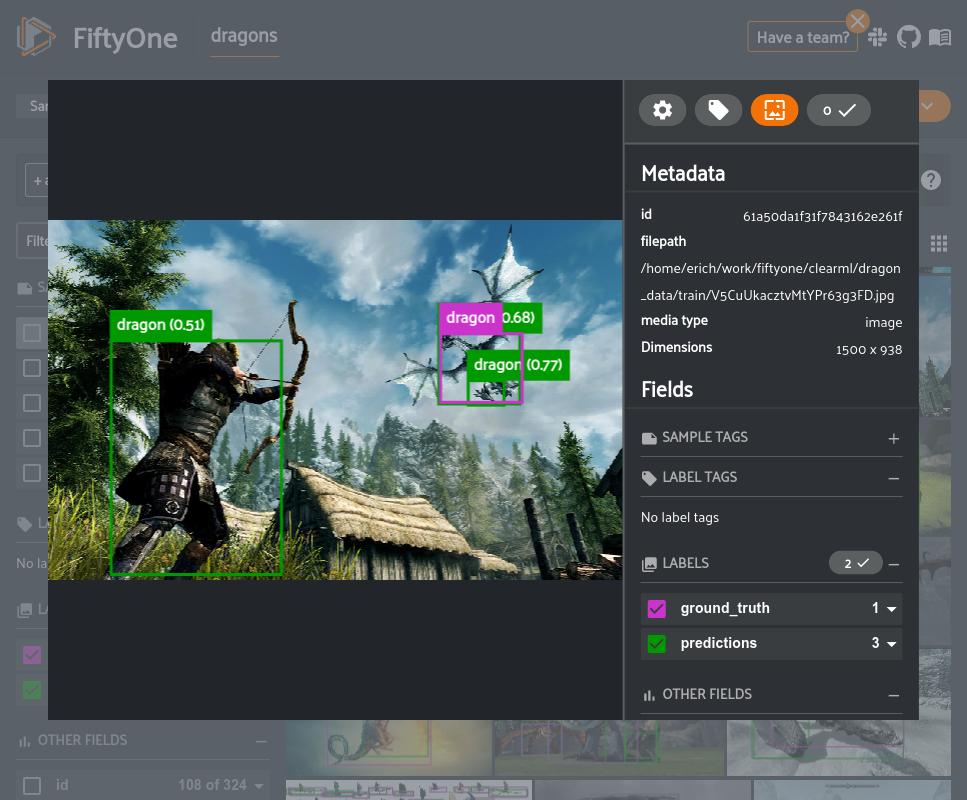

In [7]:
session = fo.launch_app(dataset)

In [9]:
session.freeze()

Once the predictions are in FiftyOne, we can easily export them in COCO format into a JSON file on disk.

In [ ]:
# Export predictions from FiftyOne dataset to disk in COCO-formatted JSON
dataset.export(
    label_field="predictions",
    label_path="/path/to/coco_predictions.json",
    dataset_type=fo.types.COCODetectionDataset,
)

 We can then upload this JSON file to our ClearML dataset to keep track of the model predictions for this iteration of the data.

### Evaluating and Filtering Results

Now that the model predictions are loaded, we can dig in and analyze the results. FiftyOne provides [methods for evaluating classification, detection, and segmentation](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html) models. While these methods can be used to compute dataset-wide metrics like so many other tools, the primary benefit is that this evaluation also populates instance-level results on the dataset like tagging individual true or false positive predictions. This allows you to not only understand how the model performs on the dataset as a whole but also specific instances in which the model performs well or poorly which is the best way to build intuition about the type of data you should use to retrain the model.


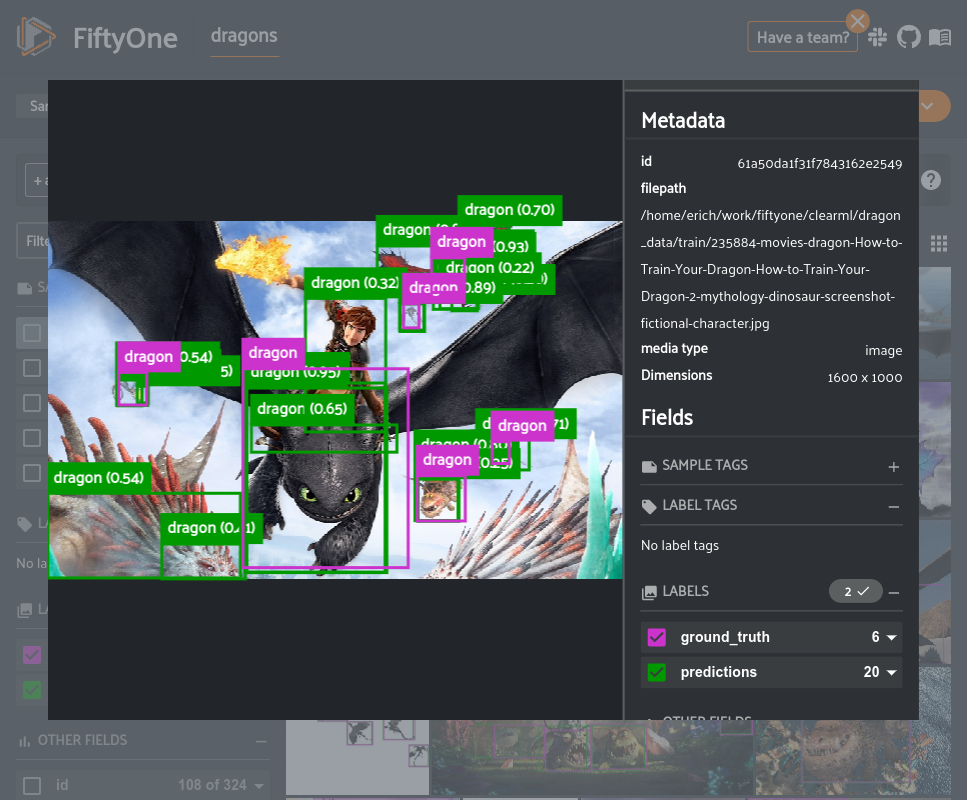

In [4]:
session = fo.launch_app(dataset)

In [ ]:
session.freeze()

Visualizing predictions in FiftyOne shows many low confidence incorrect predictions. This indicates that we should find an appropriate confidence threshold to limit the predictions in the dataset. 

One way to find a threshold value for detection confidence is to calculate the number of true and false positives that exist currently and find the point at which there are an equal number of both.

Let's call the [`evalute_detections()`](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#detections) method to use COCO-style object detection evaluation to compute if each ground truth and prediction is either a true positive, false positive, or false negative.

In [30]:
eval_key = "full_dataset_eval"
results = dataset.evaluate_detections(
    "predictions", 
    gt_field="ground_truth", 
    eval_key=eval_key, 
)

Evaluating detections...
 100% |█████████████████| 108/108 [532.6ms elapsed, 0s remaining, 202.8 samples/s]      
Performing IoU sweep...
 100% |█████████████████| 108/108 [898.6ms elapsed, 0s remaining, 120.2 samples/s]      


The FiftyOne API provides a [powerful query language](https://voxel51.com/docs/fiftyone/user_guide/using_views.html#) that can be used to [filter and slice datasets](https://voxel51.com/docs/fiftyone/user_guide/using_views.html#filtering) letting you look at the specific view in which you are interested. It also provides [dataset-wide aggregation functions](https://voxel51.com/docs/fiftyone/user_guide/using_aggregations.html) that let you easily access content from your datasets such as label values, counts, distributions, and ranges. One of these aggregations is the [`histogram_values()`](https://voxel51.com/docs/fiftyone/user_guide/using_aggregations.html#histogram-values) function that is perfect for our use case of computing the number of true and false positives for each confidence bin.

In [ ]:
from fiftyone import ViewField as F

In [ ]:
tp_view = dataset.filter_labels("predictions", F(eval_key) == "tp")
fp_view = dataset.filter_labels("predictions", F(eval_key) == "fp")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def plot_hist(counts, edges):
    counts = np.asarray(counts)
    edges = np.asarray(edges)
    left_edges = edges[:-1]
    widths = edges[1:] - edges[:-1]
    plt.bar(left_edges, counts, width=widths, align="edge")

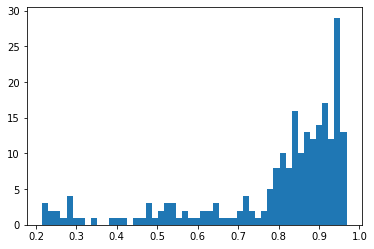

In [71]:
tp_counts, tp_edges, other = tp_view.histogram_values("predictions.detections.confidence", bins=50)
plot_hist(tp_counts, tp_edges)

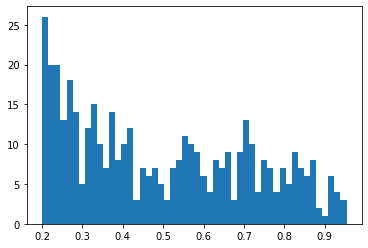

In [73]:
fp_counts, fp_edges, other = fp_view.histogram_values("predictions.detections.confidence", bins=50)
plot_hist(fp_counts, fp_edges)

Let's integrate over this histogram starting at the highest confidence to find the confidence at which the number of true positives equals the number of false positives.

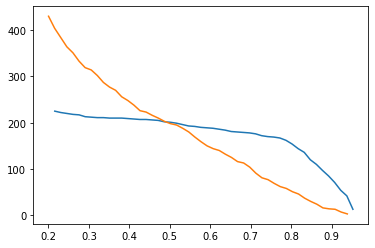

In [74]:
plt.plot(tp_edges[:-1][::-1], np.cumsum(tp_counts[::-1]))
plt.plot(fp_edges[:-1][::-1], np.cumsum(fp_counts[::-1]))
plt.show()

Based on this graph, we should set our confidence threshold to around 0.5. Let's visualize the dataset in the FiftyOne App to visually check how well this confidence threshold works for this problem.


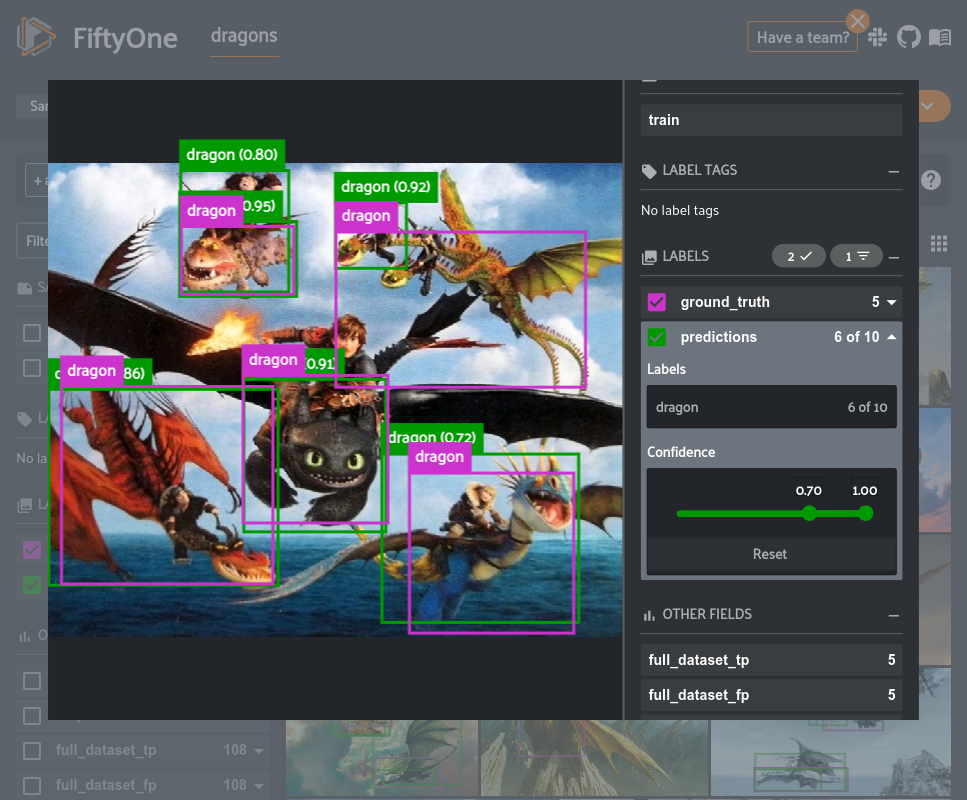

In [41]:
session.dataset = dataset

In [5]:
session.freeze()

After browsing through the samples in the dataset, a threshold of 0.5 provides enough flexibility to detect many of the dragons in the dataset without too many false positives.

Now, let's create a view programmatically using this confidence threshold and reevaluate the model predictions, computing COCO-style mAP as well this time.

In [ ]:
conf_thresh = 0.5
high_conf_view = dataset.filter_labels("predictions", F("confidence") > conf_thresh)


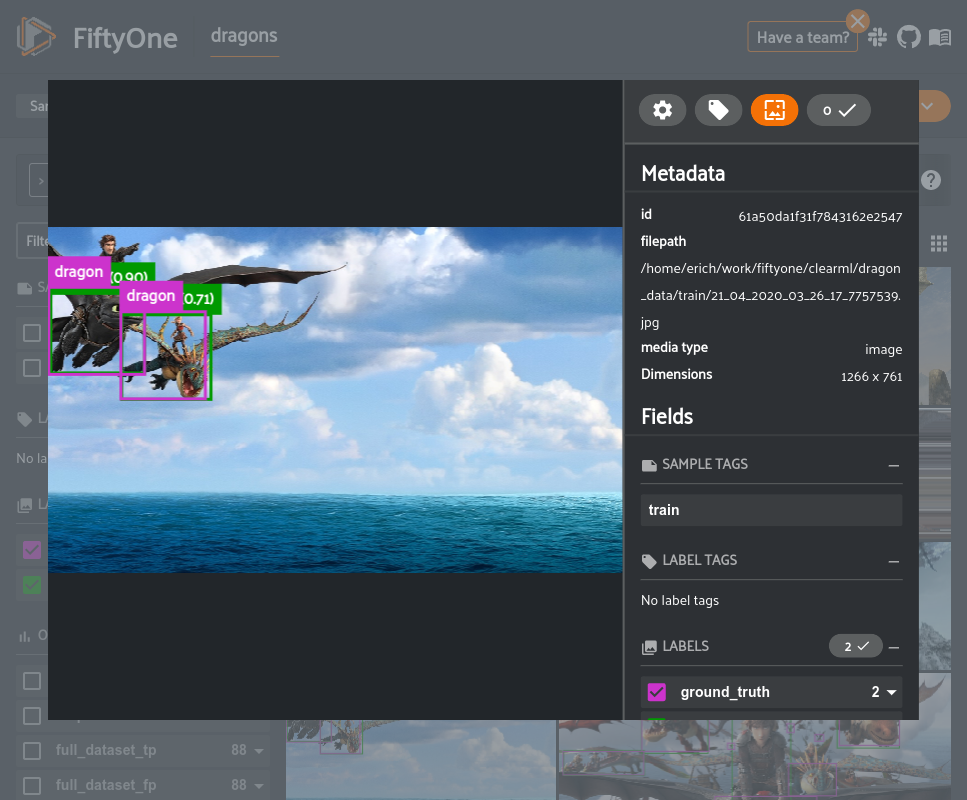

In [44]:
session.view = high_conf_view

In [ ]:
session.freeze()

In [ ]:
eval_key = "eval"

In [76]:
results = high_conf_view.evaluate_detections(
    "predictions", 
    gt_field="ground_truth", 
    eval_key=eval_key, 
    compute_mAP=True,
)

Evaluating detections...
 100% |█████████████████| 101/101 [1.1s elapsed, 0s remaining, 94.7 samples/s]          
Performing IoU sweep...
 100% |█████████████████| 101/101 [660.0ms elapsed, 0s remaining, 153.0 samples/s]      


In [78]:
print(results.mAP())

0.3416714132507098


### What can our failures teach us?

One of the primary uses of FiftyOne is the ability to easily query and explore your dataset and model predictions for any question that comes to mind. An especially useful workflow is to explore the failure modes of your model to get a sense of how to best improve it going forward.

For example, let's take a look at all of the predictions that were false positives but with high confidence, indicating that the model was fairly certain about its detection but was incorrect. These types of examples usually indicate either an ingrained issue with the model or an error in the ground truth annotations. Either need to be addressed promptly.

In [ ]:
high_conf_fp = high_conf_view.filter_labels(
    "predictions",
    (F(eval_key) == "fp") & (F("confidence") > 0.9),
)


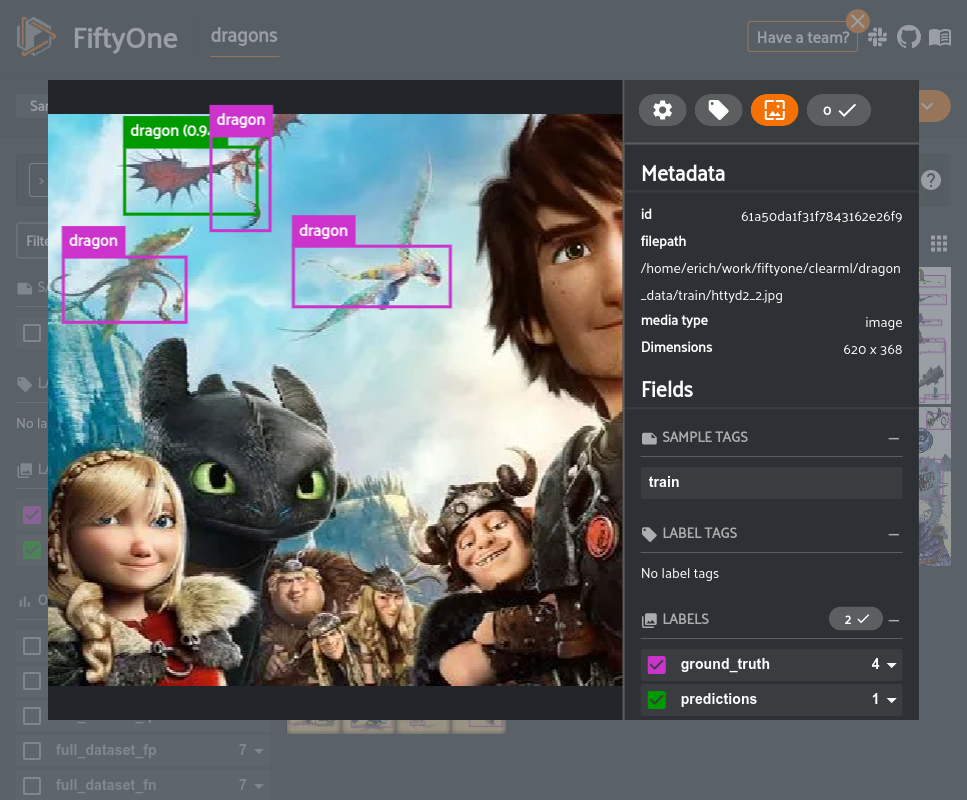

In [80]:
session.view = high_conf_fp

In [ ]:
session.freeze()

From the example above, it seems that one issue with our dataset is that we did not consistently annotate the wings of dragons. The model relatively accurately detected the dragon, but also included the wing which resulted in an IoU below the threshold used for evaluation (IoU=0.5). This detection would not necessarily be incorrect, though, so we may want to take a pass over the dataset to ensure dragon wings are consistently annotated.

An easy way to reannotate this dataset is to use the integrations between FiftyOne and annotation tools like [CVAT](https://voxel51.com/docs/fiftyone/integrations/cvat.html) or [Labelbox](https://voxel51.com/docs/fiftyone/integrations/labelbox.html).

Now, let's take a look at the false negatives in the dataset, where the model did not detect a ground truth object.

In [ ]:
fn_view = high_conf_view.filter_labels(
    "ground_truth",
    F(eval_key) == "fn",
)


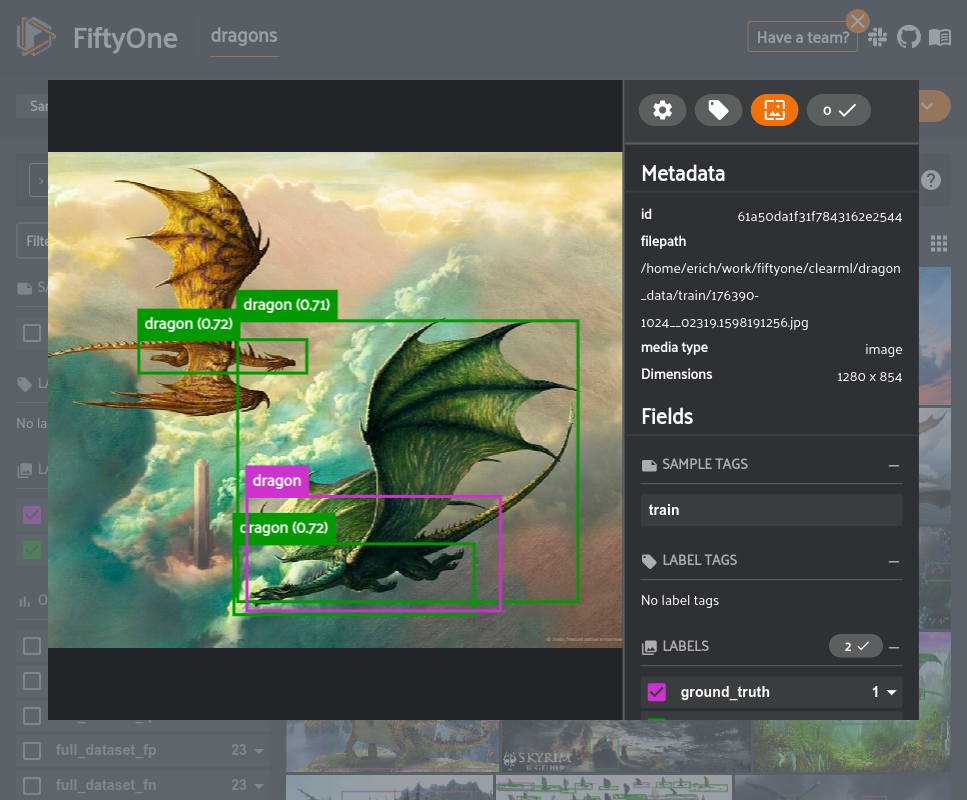

In [83]:
session.view = fn_view

In [ ]:
session.freeze()

From the example above, we see another issue of the model incorrectly localizing the bounding box, even though it did detect the presence of a dragon. The comment about reannotating the dataset to include dragon wings still holds, however, it would also be useful to add additional training data to allow the model to learn to more accurately localize the boxes.


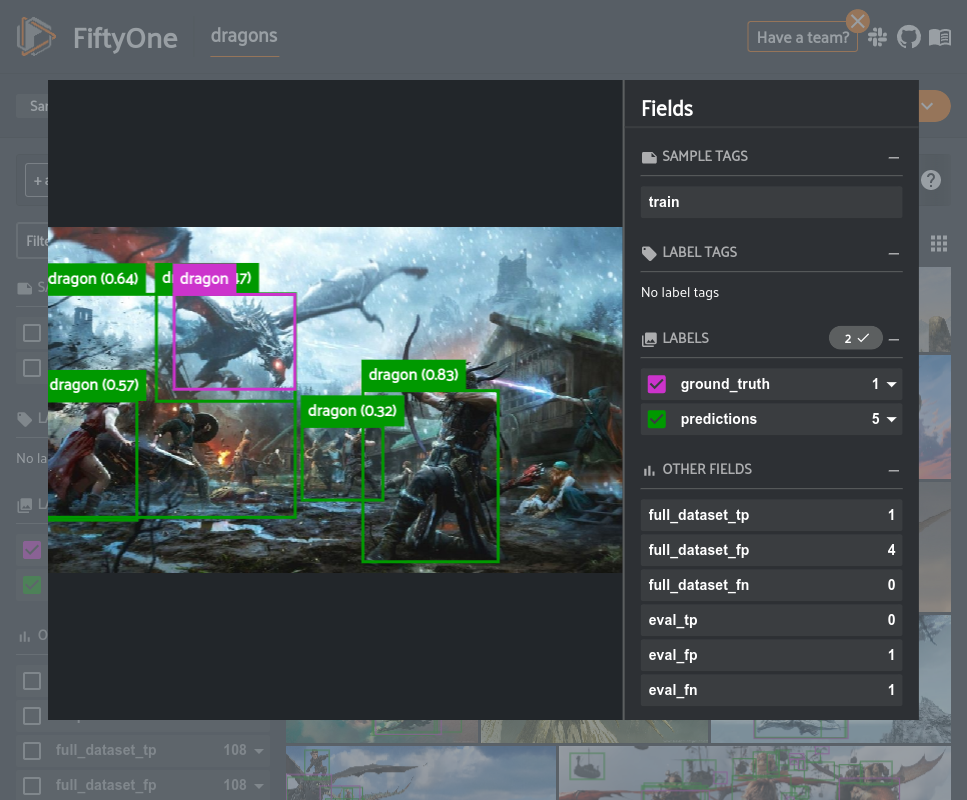

In [53]:
session.dataset = dataset

In [ ]:
session.freeze()

In the example above, we see that the model is frequently detection non-dragon objects as dragons. The majority of the samples in this dataset contain only one or a few dragons isolated from other objects. Thus, the model seems to be learning to just detect all of the focal objects in the scene.

The best way to resolve this would be to add more scenes with multiple types of objects to the dataset as well as expand the classes to other object types so that the model is able to learn to better differentiate between dragons and other objects.

### Train vs Validation split

You may have noticed that all of the examples above have included samples from both the training and validation splits. We can also create views to evaluate the training and validation samples separately.

In [ ]:
train_view = high_conf_view.match_tags("train")
val_view = high_conf_view.match_tags("val")

In [86]:
train_results = train_view.evaluate_detections(
    "predictions", 
    gt_field="ground_truth", 
    compute_mAP=True,
)
val_results = val_view.evaluate_detections(
    "predictions", 
    gt_field="ground_truth", 
    compute_mAP=True,
)

Evaluating detections...
 100% |███████████████████| 93/93 [615.8ms elapsed, 0s remaining, 151.0 samples/s]      
Performing IoU sweep...
 100% |███████████████████| 93/93 [672.7ms elapsed, 0s remaining, 138.3 samples/s]      
Evaluating detections...
 100% |█████████████████████| 8/8 [18.8ms elapsed, 0s remaining, 425.0 samples/s] 
Performing IoU sweep...
 100% |█████████████████████| 8/8 [23.1ms elapsed, 0s remaining, 346.2 samples/s] 


In [87]:
print("Train mAP: ", train_results.mAP())
print("Val mAP: ", val_results.mAP())

Train mAP:  0.34209299981356495
Val mAP:  0.43994970925664


Given the similarity in performance between the train and validation splits, it appears there may be room for further improvement in model performance by continuing to train the model for a few more epochs.

This also indicates that the analysis that we have performed on the combined train and validation splits seems to hold for unseen data.


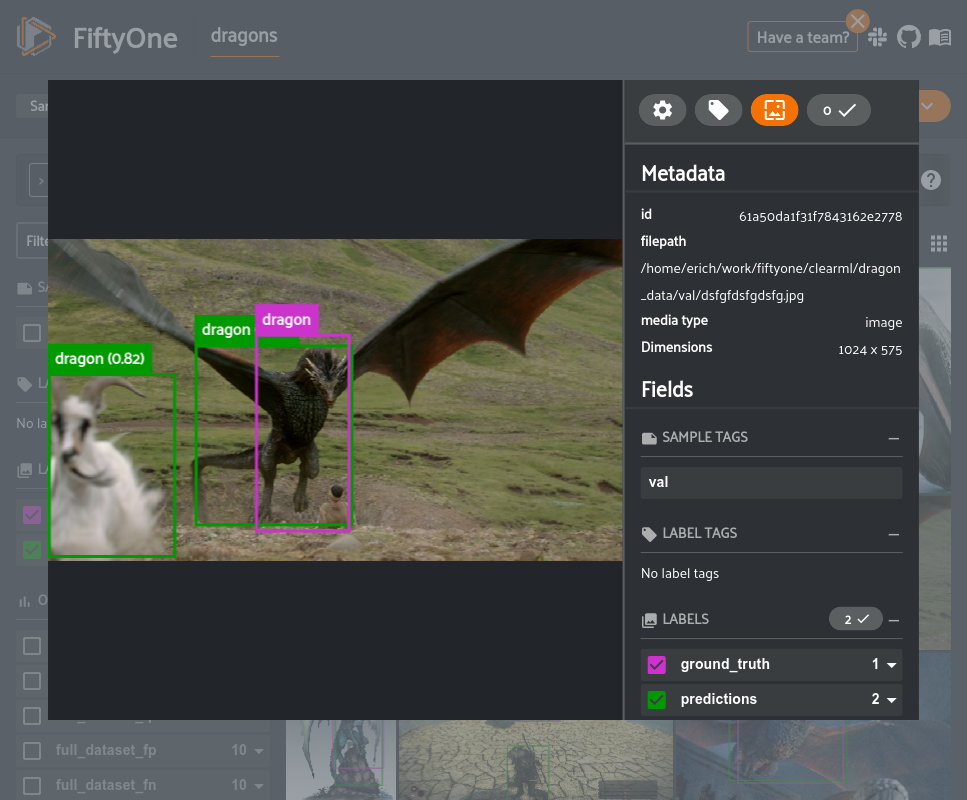

In [19]:
session = fo.launch_app(view=val_view)

In [ ]:
session.freeze()

### Visualizing Image Augmentation with FiftyOne

Building a robust model for your task is the ultimate goal of most machine learning projects. However, creating a dataset that captures all scenarios to properly train and evaluate your model is impossible. To that end, augmenting existing data to increase the number of samples in your dataset can be a cheap and effective way to train more robust models and find evaluation cases in which your model is underperforming. 

In this section, we evaluate the model we trained previously on augmented images of dragons and compare the performance to the unaugmented data. The augmentations are performed with the [Python library imgaug](https://github.com/aleju/imgaug). See the attached Colab notebook for code details. In summary, we regenerate all of the samples in the FiftyOne dataset using imgaug augmentations.

In [ ]:
!pip install imgaug

In [8]:
dataset.first().metadata

<ImageMetadata: {
    'size_bytes': None,
    'mime_type': None,
    'width': 829,
    'height': 683,
    'num_channels': None,
}>

In [ ]:
import os
import numpy as np
from PIL import Image

import imgaug as ia
import imgaug.augmenters as iaa

def augment_sample(sample, label_field, augmentations, output_dir, tags=None):
    # Load an existing sample,
    # apply given augmentations to the image and bounding boxes,
    # and return the augmented Sample
    
    os.makedirs(output_dir, exist_ok=True)
    image = Image.open(sample.filepath)
    if image.mode != "RGB":
        image = image.convert("RGB")
    image = np.array(image)
    
    img_w = sample.metadata["width"]
    img_h = sample.metadata["height"]
    bbs = []
    labels = []
    for det in sample[label_field].detections:
        labels.append(det.label)
        tlx, tly, w, h = det.bounding_box
        
        # Convert from relative [tlx,tly,w,h] to absolute [x1,y1,x2,y2]
        ia_bbox = ia.BoundingBox(
            x1 = tlx * img_w,
            y1 = tly * img_h,
            x2 = (tlx + w) * img_w,            
            y2 = (tly + h) * img_h,
        )
        bbs.append(ia_bbox)
        
    img_aug, bbs_aug = augmentations(images=[image], bounding_boxes=[bbs])
    img_aug, bbs_aug = img_aug[0], bbs_aug[0]
    aug_filepath = os.path.join(output_dir, sample.filename)
    output_img = Image.fromarray(img_aug)
    output_img.save(aug_filepath)
    aug_sample = fo.Sample(filepath=aug_filepath, tags=tags)
        
    img_h, img_w, _ = img_aug.shape
    dets = []
    for bb, label in zip(bbs_aug, labels):
        # Convert from absolute [x1,y1,x2,y2] to relative [tlx,tly,w,h]
        bbox = [
            bb.x1 / img_w,
            bb.y1 / img_h,
            (bb.x2 - bb.x1) / img_w,
            (bb.y2 - bb.y1) / img_h,
        ]
        det = fo.Detection(label=label, bounding_box=bbox)
        dets.append(det)
        
    aug_sample[label_field] = fo.Detections(detections=dets)
    
    return aug_sample

In [ ]:
# Tag all existing samples to easily filter out augmentations in the future
dataset.tag_samples("original")

In [42]:
tags = ["augmented1"]
label_field = "ground_truth"
output_dir = os.path.join(dataset_dir, "augmented1")
augmentations = iaa.Sequential([
    iaa.AdditiveGaussianNoise(scale=0.05*255),
    iaa.Affine(translate_px={"x": (1, 5)})
])

aug_samples = []
for sample in dataset.match_tags("original"):
    aug_sample = augment_sample(
        sample,
        label_field,
        augmentations,
        output_dir,
        tags=tags,
    )
    aug_samples.append(aug_sample)
    
_ = dataset.add_samples(aug_samples)

 100% |█████████████████| 108/108 [143.0ms elapsed, 0s remaining, 768.6 samples/s]    



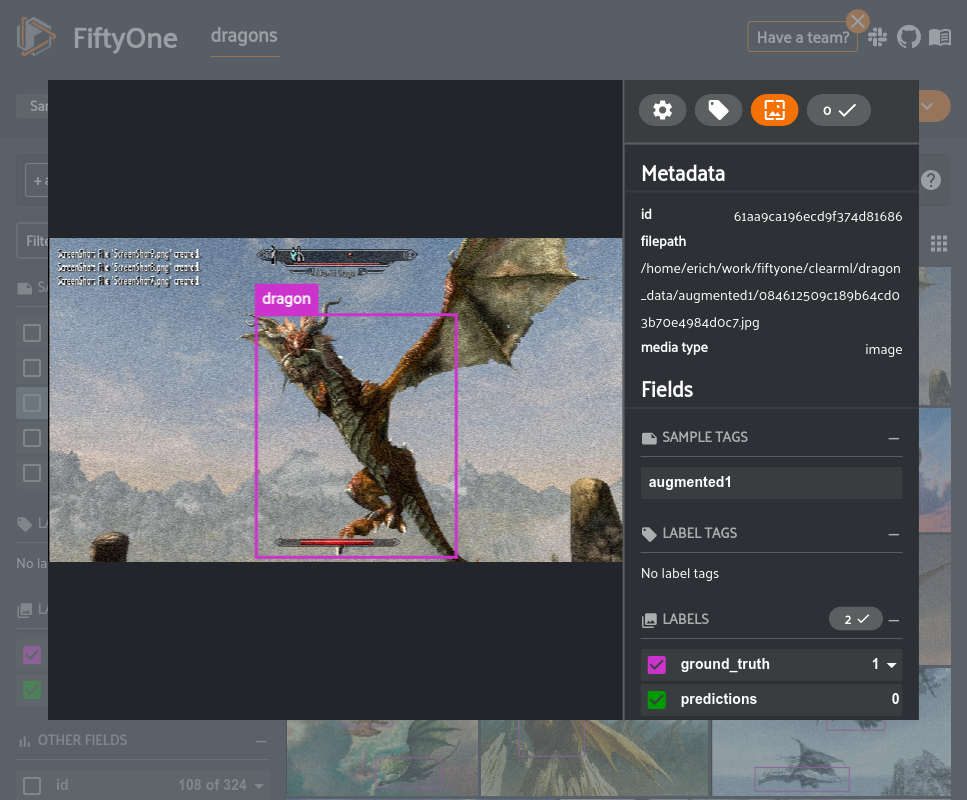

In [43]:
session = fo.launch_app(view=dataset.match_tags("augmented1"))

In [ ]:
session.freeze()

Let's also add some much more difficult augmentations (these are directly from an Imgaug example).


In [ ]:
sometimes = lambda aug: iaa.Sometimes(0.5, aug)

augmentations2 = iaa.Sequential(
    [
        # apply the following augmenters to most images
        iaa.Fliplr(0.5), # horizontally flip 50% of all images
        iaa.Flipud(0.2), # vertically flip 20% of all images
        # crop images by -5% to 10% of their height/width
        sometimes(iaa.CropAndPad(
            percent=(-0.05, 0.1),
            pad_mode=ia.ALL,
            pad_cval=(0, 255)
        )),
        sometimes(iaa.Affine(
            scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
            translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by -20 to +20 percent (per axis)
            rotate=(-45, 45), # rotate by -45 to +45 degrees
            shear=(-16, 16), # shear by -16 to +16 degrees
            order=[0, 1], # use nearest neighbour or bilinear interpolation (fast)
            cval=(0, 255), # if mode is constant, use a cval between 0 and 255
            mode=ia.ALL # use any of scikit-image's warping modes (see 2nd image from the top for examples)
        )),
        # execute 0 to 5 of the following (less important) augmenters per image
        # don't execute all of them, as that would often be way too strong
        iaa.SomeOf((0, 5),
            [
                sometimes(iaa.Superpixels(p_replace=(0, 1.0), n_segments=(20, 200))), # convert images into their superpixel representation
                iaa.OneOf([
                    iaa.GaussianBlur((0, 3.0)), # blur images with a sigma between 0 and 3.0
                    iaa.AverageBlur(k=(2, 7)), # blur image using local means with kernel sizes between 2 and 7
                    iaa.MedianBlur(k=(3, 11)), # blur image using local medians with kernel sizes between 2 and 7
                ]),
                iaa.Sharpen(alpha=(0, 1.0), lightness=(0.75, 1.5)), # sharpen images
                iaa.Emboss(alpha=(0, 1.0), strength=(0, 2.0)), # emboss images
                # search either for all edges or for directed edges,
                # blend the result with the original image using a blobby mask
                iaa.SimplexNoiseAlpha(iaa.OneOf([
                    iaa.EdgeDetect(alpha=(0.5, 1.0)),
                    iaa.DirectedEdgeDetect(alpha=(0.5, 1.0), direction=(0.0, 1.0)),
                ])),
                iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5), # add gaussian noise to images
                iaa.OneOf([
                    iaa.Dropout((0.01, 0.1), per_channel=0.5), # randomly remove up to 10% of the pixels
                    iaa.CoarseDropout((0.03, 0.15), size_percent=(0.02, 0.05), per_channel=0.2),
                ]),
                iaa.Invert(0.05, per_channel=True), # invert color channels
                iaa.Add((-10, 10), per_channel=0.5), # change brightness of images (by -10 to 10 of original value)
                iaa.AddToHueAndSaturation((-20, 20)), # change hue and saturation
                # either change the brightness of the whole image (sometimes
                # per channel) or change the brightness of subareas
                iaa.OneOf([
                    iaa.Multiply((0.5, 1.5), per_channel=0.5),
                    iaa.FrequencyNoiseAlpha(
                        exponent=(-4, 0),
                        first=iaa.Multiply((0.5, 1.5), per_channel=True),
                        second=iaa.LinearContrast((0.5, 2.0))
                    )
                ]),
                iaa.LinearContrast((0.5, 2.0), per_channel=0.5), # improve or worsen the contrast
                iaa.Grayscale(alpha=(0.0, 1.0)),
                sometimes(iaa.ElasticTransformation(alpha=(0.5, 3.5), sigma=0.25)), # move pixels locally around (with random strengths)
                sometimes(iaa.PiecewiseAffine(scale=(0.01, 0.05))), # sometimes move parts of the image around
                sometimes(iaa.PerspectiveTransform(scale=(0.01, 0.1)))
            ],
            random_order=True
        )
    ],
    random_order=True
)


In [ ]:
tags = ["augmented2"]
label_field = "ground_truth"
output_dir = os.path.join(dataset_dir, "augmented2")

aug_samples = []
for sample in dataset.match_tags("original"):
    aug_sample = augment_sample(
        sample,
        label_field,
        augmentations2,
        output_dir,
        tags=tags,
    )
    aug_samples.append(aug_sample)
    
_ = dataset.add_samples(aug_samples)



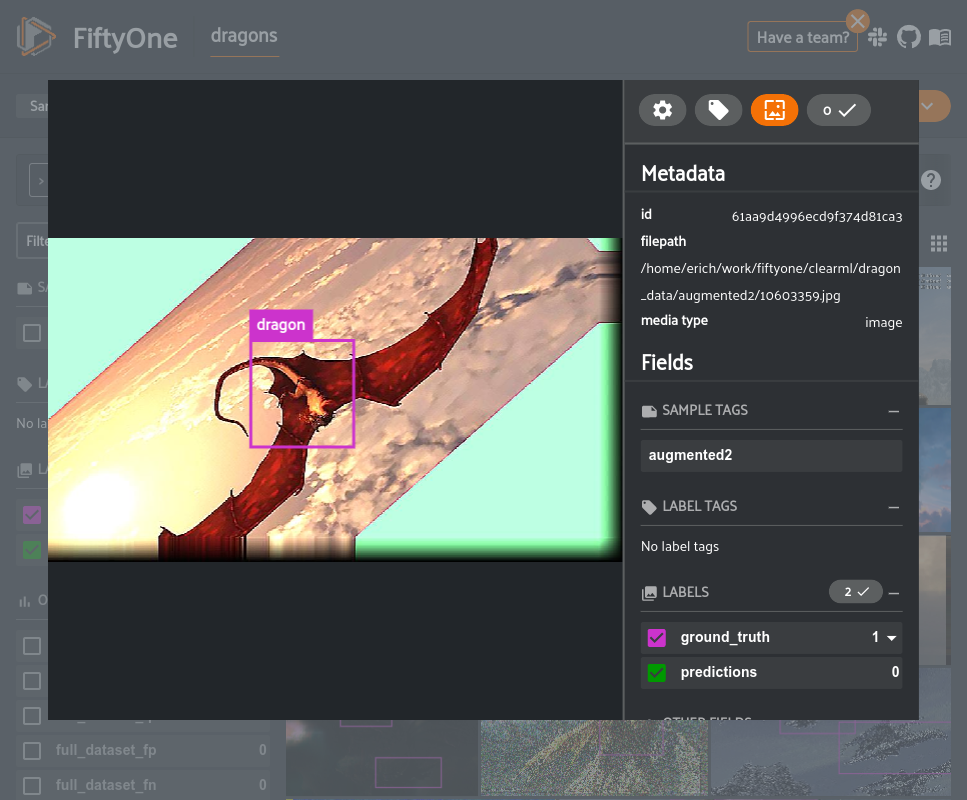

In [47]:
session.view = dataset.match_tags("augmented2")

In [ ]:
session.freeze()

Let's rerun evaluation on the two views of augmented samples and see how the model performs.

In [ ]:
aug1_view = dataset.match_tags("augmented1")
aug2_view = dataset.match_tags("augmented2")

run_inference(aug1_view, model)
run_inference(aug2_view, model)

In [ ]:
from fiftyone import ViewField as F

# Get high confidence predictions
conf_thresh = 0.5
aug1_view = aug1_view.filter_labels("predictions", F("confidence") > conf_thresh)
aug2_view = aug2_view.filter_labels("predictions", F("confidence") > conf_thresh)

In [62]:
eval_key_1 = "aug1_eval"
results1 = aug1_view.evaluate_detections(
    "predictions", 
    gt_field="ground_truth", 
    eval_key=eval_key_1, 
    compute_mAP=True,
)
print(results1.mAP())

Evaluating detections...
 100% |███████████████████| 88/88 [1.0s elapsed, 0s remaining, 84.4 samples/s]          
Performing IoU sweep...
 100% |███████████████████| 88/88 [641.6ms elapsed, 0s remaining, 137.1 samples/s]      
0.2596665720673561


In [63]:
eval_key_2 = "aug2_eval"
results2 = aug2_view.evaluate_detections(
    "predictions", 
    gt_field="ground_truth", 
    eval_key=eval_key_2, 
    compute_mAP=True,
)
print(results2.mAP())

Evaluating detections...
 100% |███████████████████| 80/80 [1.2s elapsed, 0s remaining, 65.0 samples/s]          
Performing IoU sweep...
 100% |███████████████████| 80/80 [724.1ms elapsed, 0s remaining, 110.5 samples/s]      
0.17284998264006374


In [ ]:
aug1_eval = (
    aug1_view
    .filter_labels("predictions", (F(eval_key_1) == "fp") & (F("confidence") > 0.7))
    .filter_labels("ground_truth", F(eval_key_1) == "fn", only_matches=False)    
)
aug2_eval = (
    aug2_view
    .filter_labels("predictions", (F(eval_key_2) == "fp") & (F("confidence") > 0.7))
    .filter_labels("ground_truth", F(eval_key_2) == "fn", only_matches=False)    
)


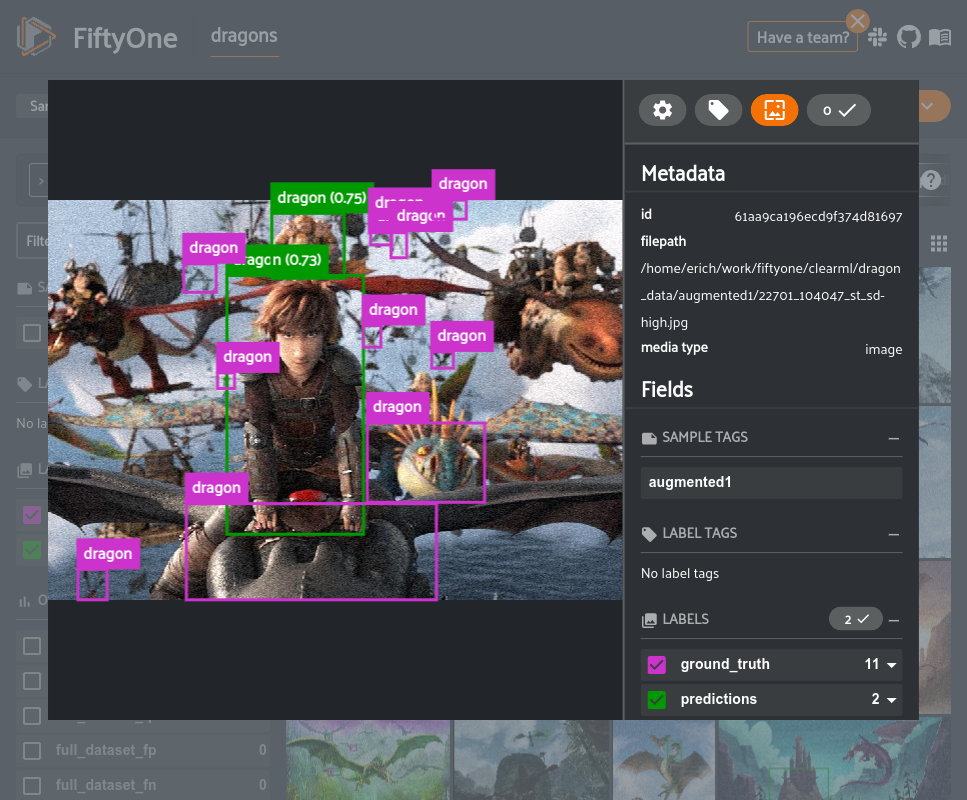

In [77]:
session.view = aug1_eval

In [ ]:
session.freeze()

Even the basic augmentations show the model having a much harder time detecting dragons and avoiding other objects, especially for small objects.


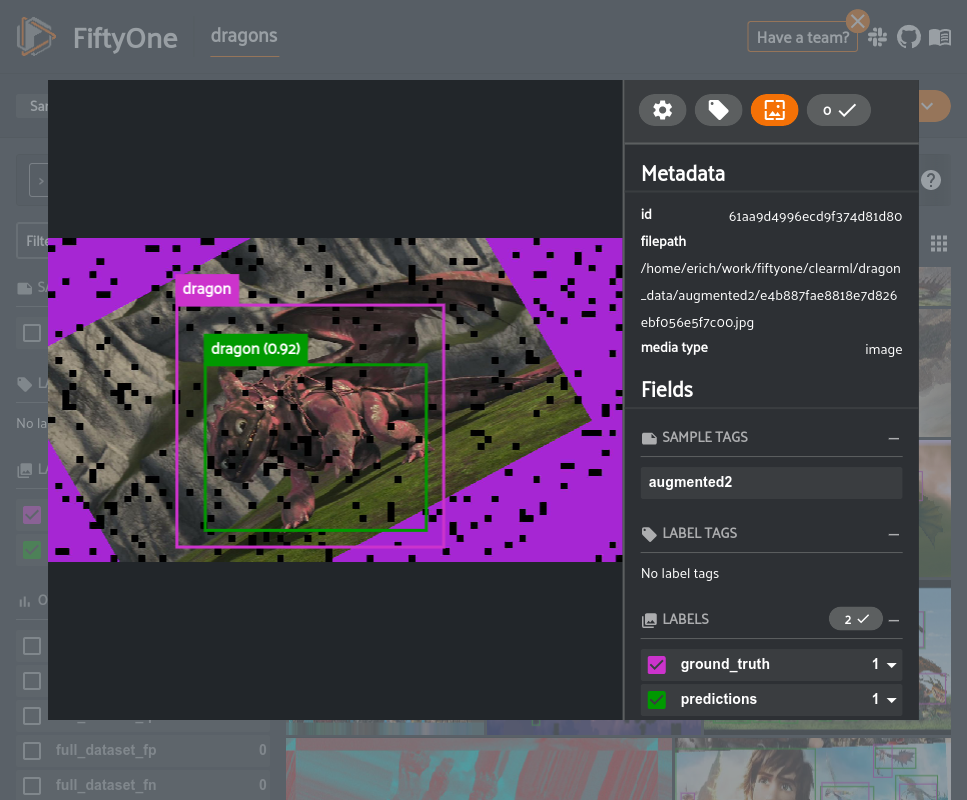

In [80]:
session.view = aug2_eval

In [ ]:
session.freeze()

While the overall performance on these extremely augmented samples is worse than the un- and slightly-augmented samples, the model still performed somewhat surprisingly well for certain augmentations as you can see above.


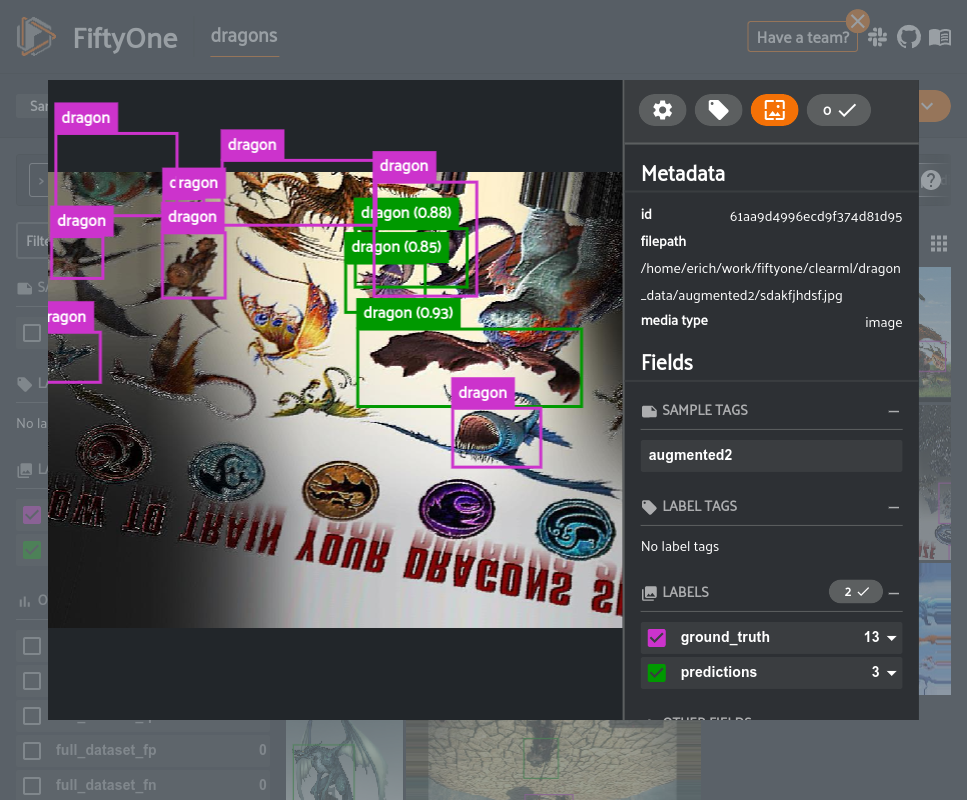

In [78]:
session.view = aug2_eval

In [ ]:
session.freeze()

An interesting point that jumped out is that the model seems to have difficulties with rotated images indicating that we may want to add that augmentation to the training dataset. We wouldn't want to miss any dragons once we put this model out in the real world just because they are flying upsidedown.

## Next Steps

Based on the observations in the previous sections, we have a plan of action for producing a higher-quality dataset and a higher-performing model.

* Update the dataset annotations taking into account the wing

* Incorporate augmentations into the training loop

* Add more difficult samples like crowds of objects

* Automate and parameterize the training loop for fast retraining iterations whenever we update the data

## Summary

Creating a high-performing model requires much more than just some PyTorch code. Being able to iteratively track and analyze model performance and then use that to inform dataset improvements is necessary for a high-quality model. The combination of the model analysis capabilities of [FiftyOne](https://fiftyone.ai) with the experiment tracking capabilities of [ClearML](https://clear.ml/) results in a system that will lead to better models, faster.

This walkthrough was made in collaboration between the teams at [ClearML](https://clear.ml/) and [Voxel51](https://voxel51.com).